### Drive mount & install detectron2 & importing libraries
Detectron2 is Facebook AI Research's next generation software system that implements state-of-the-art object detection algorithms.

In [7]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html

In [9]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import json
from pandas.io.json import json_normalize
import os
import torch
import copy

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultTrainer, DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.structures import BoxMode
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader, build_detection_train_loader
from detectron2.data import detection_utils as utils
import detectron2.data.transforms as T

### 학습 데이터의 경로

In [10]:
data_path = '개인정보 블라인드'

### Loding data

In [11]:
with open(data_path+'/train_answer.json') as json_file:
            train_json = json.load(json_file)

### Create Custom Dataset Dictionary for Detectron2
제공되는 category_id는 1(비발정), 2(발정)으로 구성되어 있으나 <br/>
정답표기 ['anestrus', 'estrus'] 리스트와 인덱스를 맞추기 위해 <br/>
내부적으로는 -1 해서 0(비발정), 1(발정)으로 사용함<br/>
추론파일에서는 예측 정답에 +1 하여 기록

In [12]:
def get_cow_dicts(train_json):
      dataset_dicts = []
      images = []

      for i_idx in range(len(train_json['images'])): 
            record = {}
            objs = []

            record["file_name"] = data_path+'/train_images/'+train_json['images'][i_idx]['file_name']
            record["height"] = train_json['images'][i_idx]['height']
            record["width"] = train_json['images'][i_idx]['width']
            record["image_id"] = train_json['images'][i_idx]['id']           

            for a_idx in range(len(train_json['annotations'])):
                      if train_json['images'][i_idx]['id'] == train_json['annotations'][a_idx]['image_id']: 
                        
                                    anno = train_json['annotations'][a_idx]['segmentation']
                                    px = [a for a in anno[0::2]]
                                    py = [a for a in anno[1::2]]
                                    poly = [(x, y) for x, y in zip(px, py)]
                                    poly = [p for x in poly for p in x]

                                    obj = {
                                          "bbox": [np.min(px), np.min(py), np.max(px), np.max(py)],
                                          "bbox_mode": BoxMode.XYXY_ABS,
                                          "segmentation": [poly],
                                          "category_id": train_json['annotations'][a_idx]['category_id']-1, # 정답 ['anestrus', 'estrus'] 인덱스를 위해 내부적으로 1,2가 아닌 -1씩해서 0,1로 사용
                                          "iscrowd": 0
                                      }
                                    objs.append(obj)
            record["annotations"] = objs
            dataset_dicts.append(record)
            
      return dataset_dicts

### Register Custom Dataset Catalog 

In [13]:
for d in ['train']:
  DatasetCatalog.register("smartcow_"+d, lambda d=d: get_cow_dicts(train_json))
  MetadataCatalog.get("smartcow_"+d).set(thing_classes=['anestrus', 'estrus'])  #['비발정', '발정']

smartcow_metadata = MetadataCatalog.get("smartcow_train")

### Data Visualization

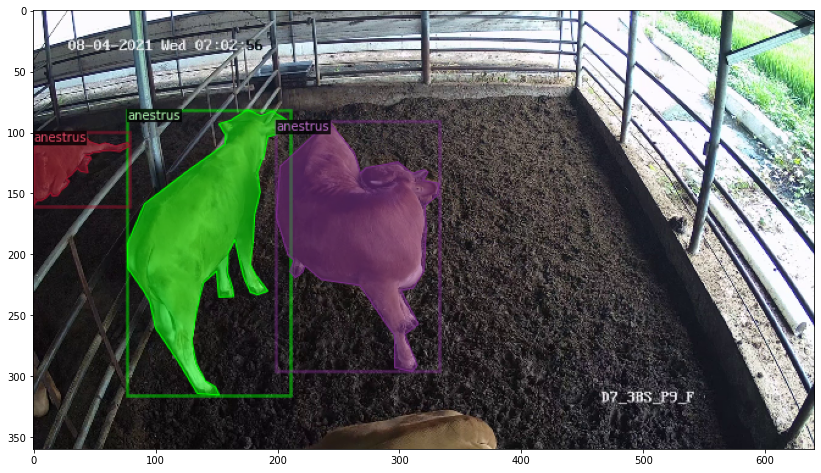

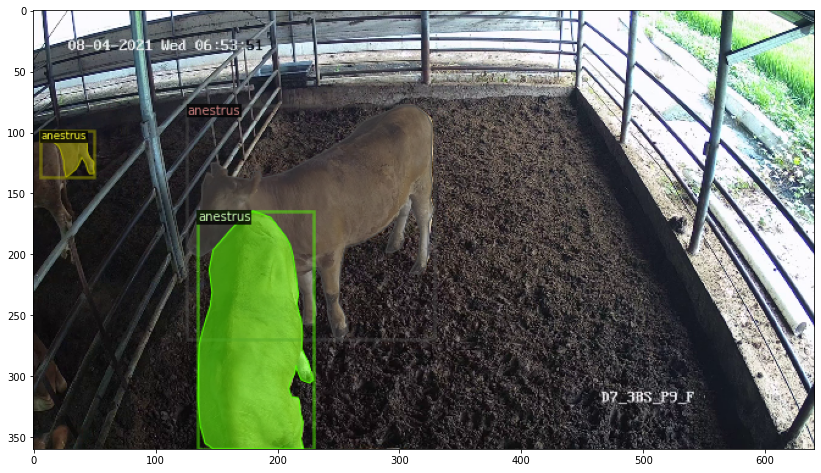

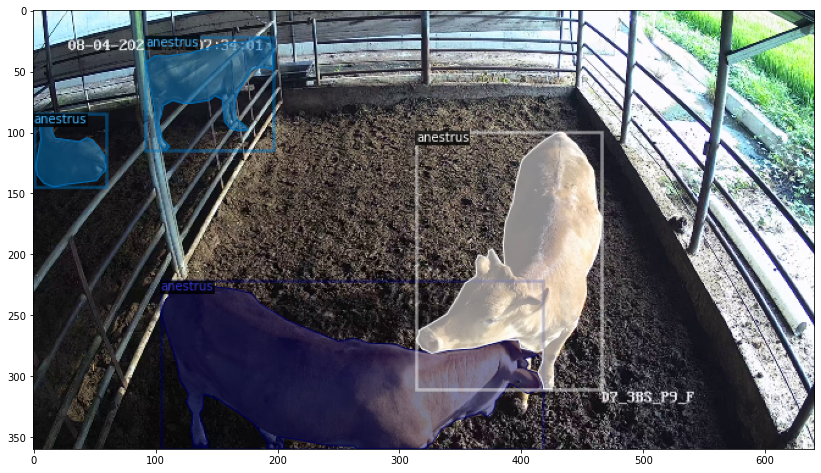

In [14]:
import random

dataset_dicts = get_cow_dicts(train_json)
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=smartcow_metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

### Data Augmentation
The dataset is transformed by changing the brighness and flipping...etc

In [15]:
def custom_mapper(dataset_dict):
    dataset_dict = copy.deepcopy(dataset_dict)
    image = utils.read_image(dataset_dict["file_name"], format="BGR")
    transform_list = [
        #T.Resize((800,600)),
        #T.RandomBrightness(0.8, 1.8),
        T.RandomContrast(0.6, 1.3),
        #T.RandomSaturation(0.8, 1.4),
        #T.RandomRotation(angle=[90, 90]),
        #T.RandomLighting(0.7),
        #T.RandomFlip(prob=0.3, horizontal=False, vertical=True),
    ]
    image, transforms = T.apply_transform_gens(transform_list, image)
    dataset_dict["image"] = torch.as_tensor(image.transpose(2, 0, 1).astype("float32"))

    annos = [
        utils.transform_instance_annotations(obj, transforms, image.shape[:2])
        for obj in dataset_dict.pop("annotations")
        if obj.get("iscrowd", 0) == 0
    ]
    instances = utils.annotations_to_instances(annos, image.shape[:2])
    dataset_dict["instances"] = utils.filter_empty_instances(instances)
    return dataset_dict
class AugTrainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=custom_mapper)

### Model configuration & Train
MODEL_ZOO의 COCO Instance Segmentation Baselines with Mask R-CNN중  R50_DC5 모델을 사용
https://github.com/facebookresearch/detectron2/blob/main/MODEL_ZOO.md#coco-instance-segmentation-baselines-with-mask-r-cnn



In [ ]:
cfg = get_cfg()

cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_DC5_3x.yaml"))
cfg.DATASETS.TRAIN = ("smartcow_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_DC5_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.002
cfg.SOLVER.MAX_ITER = 10000
cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
cfg.TEST.EVAL_PERIOD = 500
cfg.OUTPUT_DIR = '/content/drive/MyDrive/Seven_to11/output'
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True) 

#trainer = AugTrainer(cfg)
trainer = DefaultTrainer(cfg)  
trainer.resume_or_load(resume=False)
trainer.train()

[01/25 04:44:47 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): ResNet(
    (stem): BasicStem(
      (conv1): Conv2d(
        3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
        (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
      )
    )
    (res2): Sequential(
      (0): BottleneckBlock(
        (shortcut): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
        )
        (conv1): Conv2d(
          64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv2): Conv2d(
          64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
        (conv3): Conv2d(
          64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False
          (norm): FrozenBatchNorm2d(num_features=256, eps=1e-05)
 

model_final_84107b.pkl: 690MB [00:14, 46.6MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[01/25 04:45:25 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[01/25 04:45:41 d2.utils.events]:  eta: 2:05:22  iter: 19  total_loss: 2.453  loss_cls: 1.11  loss_box_reg: 0.5953  loss_mask: 0.6841  loss_rpn_cls: 0.04849  loss_rpn_loc: 0.05172  time: 0.7386  data_time: 0.0278  lr: 3.9962e-05  max_mem: 8704M
[01/25 04:45:56 d2.utils.events]:  eta: 2:04:33  iter: 39  total_loss: 1.932  loss_cls: 0.6237  loss_box_reg: 0.5787  loss_mask: 0.6169  loss_rpn_cls: 0.06397  loss_rpn_loc: 0.05605  time: 0.7421  data_time: 0.0047  lr: 7.9922e-05  max_mem: 8704M
[01/25 04:46:11 d2.utils.events]:  eta: 2:05:44  iter: 59  total_loss: 1.494  loss_cls: 0.3511  loss_box_reg: 0.5887  loss_mask: 0.4966  loss_rpn_cls: 0.02113  loss_rpn_loc: 0.04834  time: 0.7464  data_time: 0.0043  lr: 0.00011988  max_mem: 8704M
[01/25 04:46:27 d2.utils.events]:  eta: 2:05:29  iter: 79  total_loss: 1.327  loss_cls: 0.3028  loss_box_reg: 0.5861  loss_mask: 0.4046  loss_rpn_cls: 0.02762  loss_rpn_loc: 0.03669  time: 0.7503  data_time: 0.0042  lr: 0.00015984  max_mem: 8704M
[01/25 04:46:4

## tensorboard 확인

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/drive/MyDrive/Seven_to11/output

Output hidden; open in https://colab.research.google.com to view.

### Use model for inference
### predictor 생성
가중치 파일을 저장해서 따로 사용함

In [ ]:
cfg = get_cfg()

cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_DC5_3x.yaml"))
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_DC5_3x.yaml")
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
cfg.OUTPUT_DIR = '개인정보 블라인드' # 복원용 가중치 경로
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth") 
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.01
cfg.DATASETS.TEST = ("smartcow_train", )
predictor = DefaultPredictor(cfg)

test_images 폴더의 파일들을 불러와서 predictor로 추론후 형식에 맞게 정답 파일 저장

In [ ]:
with open(data_path+'/test_answer_sample.json') as json_file:
  test_json = json.load(json_file)

answer_dict = {}
objs = [] 

answer_dict['images'] = test_json['images'] 

for idx in range(len(test_json['images'])):
      img = cv2.imread(data_path+'/test_images/'+test_json['images'][idx]['file_name'])
      outputs = predictor(img)  

      for iidx in range(len(outputs['instances'].pred_boxes)):
        obj = {
                "category_id": outputs['instances'].pred_classes[iidx].tolist()+1, #내부적으로 사용하던 0(비발정), 1(발정)을 +1하여 1(비발정),2(발정)로 만듬.
                "conf": outputs['instances'].scores[iidx].tolist(),
                "image_id": test_json['images'][idx]['id'],
                "segmentation":list(outputs['instances'].pred_boxes)[iidx].tolist(),
          }
        objs.append(obj)
      answer_dict["annotations"] = objs

/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


### 정답 파일 저장

In [ ]:
file_path = '/개인정보 블라인드/submission_answer.json'
with open(file_path, 'w') as outfile:
    json.dump(answer_dict, outfile, indent=4)

### 결과 확인용

In [ ]:
catlist = []
for idx in range(len(answer_dict['annotations'])):
  catlist.append(answer_dict['annotations'][idx]['category_id'])

num_1 = catlist.count(1)
num_2 = catlist.count(2)
num_tot = num_1 + num_2
rat_1 = num_1/num_tot * 100
rat_2 = num_2/num_tot * 100
print('number of 1=', num_1, '\nnumber of 2=', num_2, '\nratio of 1=', rat_1, '\nratio of 2=', rat_2)

number of 1= 22995 
number of 2= 1520 
ratio of 1= 93.79971446053436 
ratio of 2= 6.200285539465633


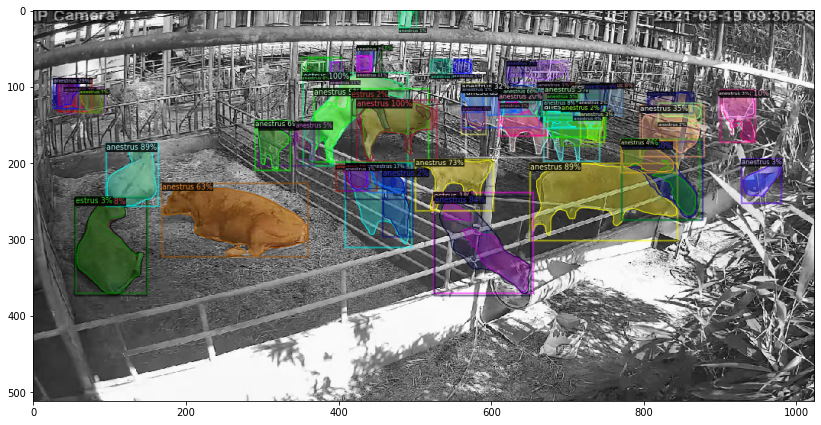

In [ ]:
from detectron2.utils.visualizer import ColorMode

MetadataCatalog.get("smartcow_train").set(thing_classes=['anestrus', 'estrus'])
smartcow_metadata = MetadataCatalog.get("smartcow_train")

img = cv2.imread(data_path+'/test_images/test_0008.jpg')
outputs = predictor(img)
v = Visualizer(img[:, :, ::-1],
                metadata=smartcow_metadata, 
                scale=0.8, 
                instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
)
v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
plt.figure(figsize = (14, 10))
plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
plt.show()